# Textile Waste Intelligence Platform
# Data Preprocessing and Deep Learning Pipeline

## Overview

This notebook continues the **Textile Waste Intelligence Platform** project by integrating the complete workflow from data preprocessing to deep learning model development. It prepares the Fabric Classification and Fabric Defect datasets for training and evaluates multiple deep learning models for textile image analysis.

## Datasets

Two datasets are used in this notebook:

1. **Fabric Classification Dataset** – Multi-class dataset containing **17 selected fabric categories** used for fabric type classification.
2. **Fabric Defect Dataset** – Multi-class dataset containing **6 defect categories** used for textile defect detection.

## Workflow

### Data Preprocessing

The datasets are prepared through the following preprocessing steps:

- Load images while ignoring non-image metadata files (e.g., `tag.txt`)
- Convert grayscale images to RGB where required
- Resize all images to **224 × 224** pixels
- Normalize pixel values
- Apply data augmentation for training
- Split datasets into **Training (70%)**, **Validation (15%)**, and **Testing (15%)** using a fixed random seed
- Save the processed datasets into a structured directory
- Verify preprocessing through visualizations and dataset statistics

### Deep Learning Model Development

Two deep learning approaches are implemented and compared:

- **Custom Convolutional Neural Network (CNN)** trained from scratch.
- **EfficientNetB0** using transfer learning with ImageNet pretrained weights.
- Fine-tuning of the final EfficientNetB0 layers to improve domain-specific performance.
- Performance evaluation using:
  - Training and validation accuracy/loss curves
  - Confusion matrices
  - Classification reports
  - Precision, Recall, and F1-score
  - Sample predictions
- Comparison of Custom CNN and EfficientNetB0 to identify the best-performing model for each task.

## Expected Outputs

- Processed datasets stored in:

  - `processed_dataset/fabric/{train,validation,test}/<class>/...`
  - `processed_dataset/defect/{train,validation,test}/<class>/...`

- Trained deep learning models:

  - Custom CNN
  - Fine-tuned EfficientNetB0
  - Best-performing model for Fabric Classification
  - Best-performing model for Fabric Defect Classification

- Evaluation results including:
  - Training and validation curves
  - Confusion matrices
  - Classification reports
  - Model comparison tables
  - Saved `.keras` model files ready for deployment in the Textile Waste Intelligence Platform.

## 1. Import Libraries

In [1]:
# Import Libraries
import os
import cv2
import time
import shutil
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path
from PIL import Image

from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tqdm import tqdm

plt.style.use("ggplot")

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

In [2]:
# Install Kaggle
!pip install -q kaggle

In [64]:
 # Upload kaggle.json
#from google.colab import files
#files.upload()

In [4]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [5]:
!kaggle datasets download -d orchit/the-fabrics-dataset-by-ibug
!kaggle datasets download -d nexuswho/fabric-defects-dataset

Dataset URL: https://www.kaggle.com/datasets/orchit/the-fabrics-dataset-by-ibug
License(s): unknown
100% 1.77G/1.77G [01:24<00:00, 22.4MB/s]

Dataset URL: https://www.kaggle.com/datasets/nexuswho/fabric-defects-dataset
License(s): Attribution 4.0 International (CC BY 4.0)
100% 2.09G/2.09G [01:42<00:00, 21.8MB/s]



In [6]:
!unzip -q the-fabrics-dataset-by-ibug.zip -d /content/fabrics_dataset
!unzip -q fabric-defects-dataset.zip -d /content/defects_dataset

In [7]:
import os

print(os.path.exists("/content/fabrics_dataset"))
print(os.path.exists("/content/defects_dataset"))

True
True


## 2. Dataset Configuration

In [8]:
# Dataset Configuration
FABRIC_DATASET_PATH = "/content/fabrics_dataset"
DEFECT_DATASET_PATH = "/content/defects_dataset/Fabric Defects Dataset/Fabric Defect Dataset"

PROCESSED_DATASET_PATH = "/content/processed_dataset"
FABRIC_OUTPUT_PATH = os.path.join(PROCESSED_DATASET_PATH, "fabric")
DEFECT_OUTPUT_PATH = os.path.join(PROCESSED_DATASET_PATH, "defect")

IMG_SIZE = (224, 224)

TRAIN_RATIO = 0.70
VAL_RATIO = 0.15
TEST_RATIO = 0.15

VALID_EXTENSIONS = ["*.jpg", "*.jpeg", "*.png", "*.bmp", "*.webp"]

os.makedirs(PROCESSED_DATASET_PATH, exist_ok=True)

## 3. Verify Dataset Paths

In [9]:
# Verify that the raw datasets from Notebook 1 are available
print("Fabric Dataset Exists :", os.path.exists(FABRIC_DATASET_PATH))
print("Defect Dataset Exists :", os.path.exists(DEFECT_DATASET_PATH))

if not os.path.exists(FABRIC_DATASET_PATH) or not os.path.exists(DEFECT_DATASET_PATH):
    raise FileNotFoundError(
        "Raw datasets not found. Please re-run the Kaggle download steps from Notebook 1 "
        "before continuing with preprocessing."
    )

Fabric Dataset Exists : True
Defect Dataset Exists : True


In [10]:
import os

print(os.listdir("/content"))

['.config', 'the-fabrics-dataset-by-ibug.zip', 'processed_dataset', 'fabrics_dataset', 'fabric-defects-dataset.zip', 'kaggle.json', 'defects_dataset', 'sample_data']


## 4. Image Loading Pipeline

The functions below form the core, reusable preprocessing pipeline. They are shared by both the Fabric and Defect datasets so that every image goes through identical cleaning, color-conversion, resizing, and normalization steps.

In [11]:
def load_and_preprocess_image(img_path, target_size=IMG_SIZE):
    """
    Load a single image from disk and preprocess it.

    Steps performed:
    - Read the image safely (handles corrupted files gracefully)
    - Convert grayscale / single-channel images to RGB
    - Resize to the target size
    - Normalize pixel values to [0, 1]

    Returns a float32 numpy array of shape (H, W, 3), or None if the
    image could not be read.
    """

    try:
        img = cv2.imread(str(img_path), cv2.IMREAD_UNCHANGED)

        if img is None:
            return None

        # Convert grayscale (2D) images to 3-channel RGB
        if len(img.shape) == 2:
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

        # Convert BGRA / RGBA images to RGB
        elif img.shape[2] == 4:
            img = cv2.cvtColor(img, cv2.COLOR_BGRA2RGB)

        # Standard BGR images
        elif img.shape[2] == 3:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        img = cv2.resize(img, target_size, interpolation=cv2.INTER_AREA)

        img = img.astype("float32") / 255.0

        return img

    except Exception as e:
        print(f"Failed to process {img_path}: {e}")
        return None


def denormalize_for_display(img):
    """Convert a normalized [0,1] float image back to uint8 for display / saving."""
    return (img * 255.0).clip(0, 255).astype("uint8")

## 5. Fabric Dataset Preprocessing

The fabric dataset is organized as `Class/SampleID/im_1.png ... im_4.png` with a `tag.txt` file inside each sample folder. Images are collected recursively from the sample folders, `tag.txt` is ignored, and each image is labeled with its parent fabric class.

In [12]:
def build_fabric_metadata(dataset_path):
    """
    Walk the fabric dataset and build a metadata DataFrame of
    (image_path, label) pairs, ignoring tag.txt files.
    """

    records = []

    for class_folder in sorted(Path(dataset_path).iterdir()):

        if not class_folder.is_dir():
            continue

        label = class_folder.name

        for sample_folder in class_folder.iterdir():

            if not sample_folder.is_dir():
                continue

            for ext in VALID_EXTENSIONS:
                for img_path in sample_folder.glob(ext):
                    records.append({"image_path": str(img_path), "label": label})

    return pd.DataFrame(records)


fabric_metadata = build_fabric_metadata(FABRIC_DATASET_PATH)

print(f"Total Fabric Images : {len(fabric_metadata)}")
print(f"Total Fabric Classes: {fabric_metadata['label'].nunique()}")

fabric_metadata.head()

Total Fabric Images : 7885
Total Fabric Classes: 25


,image_path,label
0,/content/fabrics_dataset/Acrylic/184/im_2.png,Acrylic
1,/content/fabrics_dataset/Acrylic/184/im_3.png,Acrylic
2,/content/fabrics_dataset/Acrylic/184/im_1.png,Acrylic
3,/content/fabrics_dataset/Acrylic/184/im_4.png,Acrylic
4,/content/fabrics_dataset/Acrylic/506/im_2.png,Acrylic


## 6. Defect Dataset Preprocessing

The defect dataset is organized as `DefectClass/image.jpg`. Images are collected recursively from each defect class folder and labeled accordingly.

In [13]:
def build_defect_metadata(dataset_path):
    """
    Walk the defect dataset and build a metadata DataFrame of
    (image_path, label) pairs.
    """

    records = []

    for class_folder in sorted(Path(dataset_path).iterdir()):

        if not class_folder.is_dir():
            continue

        label = class_folder.name

        for ext in VALID_EXTENSIONS:
            for img_path in class_folder.rglob(ext):
                records.append({"image_path": str(img_path), "label": label})

    return pd.DataFrame(records)


defect_metadata = build_defect_metadata(DEFECT_DATASET_PATH)

print(f"Total Defect Images : {len(defect_metadata)}")
print(f"Total Defect Classes: {defect_metadata['label'].nunique()}")

defect_metadata.head()

Total Defect Images : 2739
Total Defect Classes: 6


,image_path,label
0,/content/defects_dataset/Fabric Defects Datase...,Vertical
1,/content/defects_dataset/Fabric Defects Datase...,Vertical
2,/content/defects_dataset/Fabric Defects Datase...,Vertical
3,/content/defects_dataset/Fabric Defects Datase...,Vertical
4,/content/defects_dataset/Fabric Defects Datase...,Vertical


## 7. Data Augmentation

Augmentation is defined here as a reusable `ImageDataGenerator`, applied **only to the training split** and only on-the-fly during model training in Notebook 3. Augmented images are not written to disk, since materializing every augmented variant would bloat the dataset and risks over-augmenting the already-normalized data.

Recommended augmentations used: horizontal flip, random rotation, random zoom, random brightness, and random width/height shift, all kept within mild ranges.

Aug 1 | shape=(224, 224, 3) | dtype=float32 | min=0.039 | max=0.870
Aug 2 | shape=(224, 224, 3) | dtype=float32 | min=0.052 | max=0.860
Aug 3 | shape=(224, 224, 3) | dtype=float32 | min=0.047 | max=0.866
Aug 4 | shape=(224, 224, 3) | dtype=float32 | min=0.043 | max=0.871
Aug 5 | shape=(224, 224, 3) | dtype=float32 | min=0.053 | max=0.858


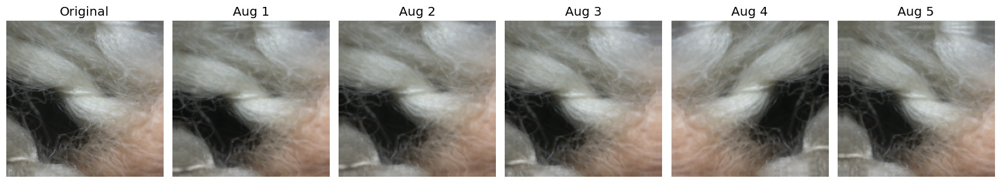

In [14]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

# Data Augmentation Pipeline
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.02),
    tf.keras.layers.RandomZoom(0.05),
    tf.keras.layers.RandomTranslation(0.03, 0.03),
    tf.keras.layers.RandomContrast(0.05),
], name="data_augmentation")

# Preview Augmented Images
def preview_augmentations(img_array, augmenter=data_augmentation, n_samples=5):
    """
    Display augmented versions of a single image.

    Parameters
    ----------
    img_array : numpy.ndarray
        Normalized RGB image (224x224x3) with values in [0,1]

    augmenter : keras.Sequential
        Data augmentation pipeline

    n_samples : int
        Number of augmented samples to display
    """

    plt.figure(figsize=(16,4))

    # Original Image
    plt.subplot(1, n_samples + 1, 1)
    plt.imshow(img_array)
    plt.title("Original")
    plt.axis("off")

    img_tensor = tf.expand_dims(img_array, axis=0)

    for i in range(n_samples):

        aug_img = augmenter(img_tensor, training=True)

        aug_img = aug_img[0].numpy()

        print(
            f"Aug {i+1} | "
            f"shape={aug_img.shape} | "
            f"dtype={aug_img.dtype} | "
            f"min={aug_img.min():.3f} | "
            f"max={aug_img.max():.3f}"
        )

        plt.subplot(1, n_samples + 1, i + 2)
        plt.imshow(np.clip(aug_img, 0, 1))
        plt.title(f"Aug {i+1}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Test on One Image
sample_img = load_and_preprocess_image(
    fabric_metadata.iloc[0]["image_path"]
)

if sample_img is not None:
    preview_augmentations(sample_img)
else:
    print("Could not load sample image.")

Aug 1 | shape=(224, 224, 3) | dtype=float32 | min=0.000 | max=1.008
Aug 2 | shape=(224, 224, 3) | dtype=float32 | min=0.000 | max=0.977
Aug 3 | shape=(224, 224, 3) | dtype=float32 | min=0.000 | max=1.012
Aug 4 | shape=(224, 224, 3) | dtype=float32 | min=0.000 | max=1.031
Aug 5 | shape=(224, 224, 3) | dtype=float32 | min=0.000 | max=1.011


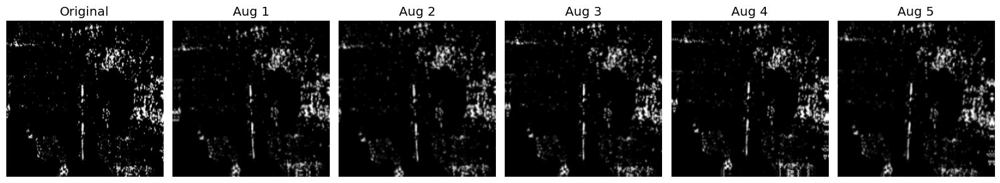

In [15]:
# Defect Dataset Augmentation Pipeline

defect_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomRotation(0.01),          # ±3.6°
    tf.keras.layers.RandomZoom(0.03),              # 3% zoom
    tf.keras.layers.RandomTranslation(0.02, 0.02), # Small shift
    tf.keras.layers.RandomContrast(0.05),          # Slight contrast change
], name="defect_augmentation")

# Preview Defect Augmentations
def preview_defect_augmentations(img_array,
                                 augmenter=defect_augmentation,
                                 n_samples=5):

    plt.figure(figsize=(16,4))

    # Original Image
    plt.subplot(1, n_samples + 1, 1)
    plt.imshow(img_array)
    plt.title("Original")
    plt.axis("off")

    img_tensor = tf.expand_dims(img_array, axis=0)

    for i in range(n_samples):

        aug_img = augmenter(img_tensor, training=True)[0].numpy()

        print(
            f"Aug {i+1} | "
            f"shape={aug_img.shape} | "
            f"dtype={aug_img.dtype} | "
            f"min={aug_img.min():.3f} | "
            f"max={aug_img.max():.3f}"
        )

        plt.subplot(1, n_samples + 1, i + 2)
        plt.imshow(np.clip(aug_img, 0, 1))
        plt.title(f"Aug {i+1}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Test on One Defect Image
sample_defect = load_and_preprocess_image(
    defect_metadata.iloc[0]["image_path"]
)

if sample_defect is not None:
    preview_defect_augmentations(sample_defect)
else:
    print("Could not load sample defect image.")

In [16]:
print(fabric_metadata["label"].value_counts().sort_values())

label
Artificial_fur           4
Utilities                8
Artificial_leather      12
Felt                    16
Lut                     16
Suede                   20
Velvet                  44
Acrylic                 48
Chenille                52
Leather                 64
Linen                   76
Corduroy                96
Satin                   96
Crepe                  104
Terrycloth             120
Fleece                 132
Viscose                148
Silk                   200
Nylon                  228
Wool                   360
Unclassified           492
Denim                  648
Polyester              904
Blended               1645
Cotton                2352
Name: count, dtype: int64


In [17]:
MIN_IMAGES = 50

valid_classes = (
    fabric_metadata["label"]
    .value_counts()
    .loc[lambda x: x >= MIN_IMAGES]
    .index
)

fabric_metadata = fabric_metadata[
    fabric_metadata["label"].isin(valid_classes)
].reset_index(drop=True)

print("Classes kept:", fabric_metadata["label"].nunique())
print(fabric_metadata["label"].value_counts().sort_index())

Classes kept: 17
label
Blended         1645
Chenille          52
Corduroy          96
Cotton          2352
Crepe            104
Denim            648
Fleece           132
Leather           64
Linen             76
Nylon            228
Polyester        904
Satin             96
Silk             200
Terrycloth       120
Unclassified     492
Viscose          148
Wool             360
Name: count, dtype: int64


## 8. Train / Validation / Test Split

Both datasets are split independently using a stratified split so that class proportions are preserved in every subset. A fixed `SEED` keeps the split reproducible.

In [18]:
from sklearn.model_selection import train_test_split

def stratified_split(
    metadata_df,
    train_ratio=TRAIN_RATIO,
    val_ratio=VAL_RATIO,
    test_ratio=TEST_RATIO,
    seed=SEED
):
    """
    Split dataset into train/validation/test while preserving
    class distribution in every split.
    """

    assert abs(train_ratio + val_ratio + test_ratio - 1.0) < 1e-6

    # First split: Train vs Temp
    train_df, temp_df = train_test_split(
        metadata_df,
        train_size=train_ratio,
        stratify=metadata_df["label"],
        random_state=seed
    )

    # Relative validation size
    relative_val_ratio = val_ratio / (val_ratio + test_ratio)

    # Second split: Validation vs Test (also stratified)
    val_df, test_df = train_test_split(
        temp_df,
        train_size=relative_val_ratio,
        stratify=temp_df["label"],      # <-- THIS IS THE IMPORTANT FIX
        random_state=seed
    )

    return (
        train_df.reset_index(drop=True),
        val_df.reset_index(drop=True),
        test_df.reset_index(drop=True)
    )

In [19]:
# Fabric split
fabric_train_df, fabric_val_df, fabric_test_df = stratified_split(fabric_metadata)

# Defect split
defect_train_df, defect_val_df, defect_test_df = stratified_split(defect_metadata)

print("Fabric:",
      len(fabric_train_df),
      len(fabric_val_df),
      len(fabric_test_df))

print("Defect:",
      len(defect_train_df),
      len(defect_val_df),
      len(defect_test_df))

Fabric: 5401 1158 1158
Defect: 1917 411 411


## 9. Save Processed Dataset

Each image is loaded, cleaned, resized, and normalized using `load_and_preprocess_image`, then written to disk under the matching split/class folder. Corrupted or unreadable images are skipped and reported instead of stopping the pipeline.

In [20]:
def save_split(df, split_name, output_root):
    """
    Preprocess and save every image in a split to
    output_root/split_name/label/filename.png
    """

    skipped = []

    for _, row in tqdm(df.iterrows(), total=len(df), desc=f"Saving {split_name}"):

        img = load_and_preprocess_image(row["image_path"])

        if img is None:
            skipped.append(row["image_path"])
            continue

        class_dir = Path(output_root) / split_name / row["label"]
        class_dir.mkdir(parents=True, exist_ok=True)

        # Create a unique filename to avoid overwriting
        image_path = Path(row["image_path"])

        parent_folder = image_path.parent.name      # Example: 114
        file_name = image_path.stem                 # Example: im_1

        out_name = f"{parent_folder}_{file_name}.png"
        out_path = class_dir / out_name

        try:
            cv2.imwrite(str(out_path), cv2.cvtColor(denormalize_for_display(img), cv2.COLOR_RGB2BGR))
        except Exception as e:
            print(f"Failed to save {out_path}: {e}")
            skipped.append(row["image_path"])

    return skipped


def build_processed_dataset(train_df, val_df, test_df, output_root):
    """Run save_split across all three splits and return any skipped image paths."""

    skipped_all = []

    skipped_all += save_split(train_df, "train", output_root)
    skipped_all += save_split(val_df, "validation", output_root)
    skipped_all += save_split(test_df, "test", output_root)

    print(f"\nSkipped {len(skipped_all)} unreadable image(s) while saving to {output_root}")

    return skipped_all

In [21]:
# Save Fabric Dataset
fabric_skipped = build_processed_dataset(
    fabric_train_df, fabric_val_df, fabric_test_df, FABRIC_OUTPUT_PATH
)

Saving test: 100%|██████████| 1158/1158 [00:13<00:00, 85.05it/s]


Skipped 0 unreadable image(s) while saving to /content/processed_dataset/fabric


In [22]:
# Save Defect Dataset
defect_skipped = build_processed_dataset(
    defect_train_df, defect_val_df, defect_test_df, DEFECT_OUTPUT_PATH
)

Saving test: 100%|██████████| 411/411 [00:11<00:00, 34.37it/s]


Skipped 0 unreadable image(s) while saving to /content/processed_dataset/defect


## 10. Display Sample Processed Images

A quick before/after comparison confirms the pipeline is behaving as expected: grayscale conversion, resizing to 224 x 224, and normalization to [0, 1].

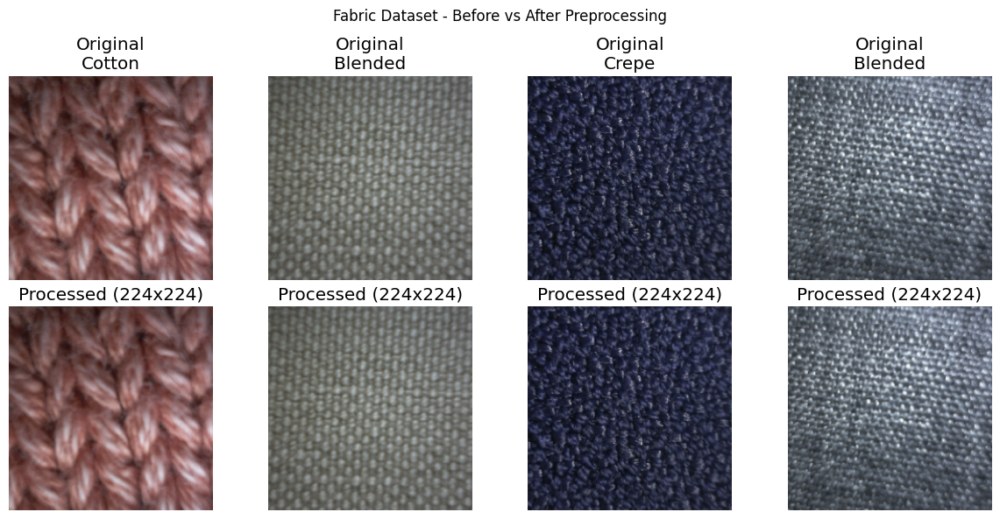

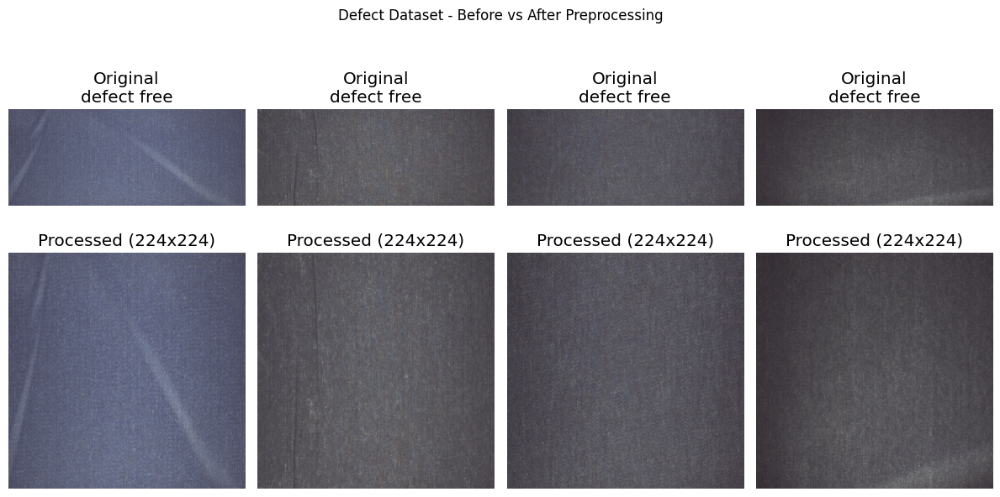

In [23]:
def show_before_after(metadata_df, title, n_samples=4):
    """Display raw vs. preprocessed versions of a few random images."""

    samples = metadata_df.sample(n_samples, random_state=SEED)

    plt.figure(figsize=(12, 6))

    for i, (_, row) in enumerate(samples.iterrows()):

        original = Image.open(row["image_path"])
        processed = load_and_preprocess_image(row["image_path"])

        if processed is None:
            continue

        plt.subplot(2, n_samples, i + 1)
        plt.imshow(original)
        plt.title(f"Original\n{row['label']}")
        plt.axis("off")

        plt.subplot(2, n_samples, n_samples + i + 1)
        plt.imshow(processed)
        plt.title("Processed (224x224)")
        plt.axis("off")

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()


show_before_after(fabric_metadata, "Fabric Dataset - Before vs After Preprocessing")
show_before_after(defect_metadata, "Defect Dataset - Before vs After Preprocessing")

In [24]:
BATCH_SIZE = 32

fabric_train_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(FABRIC_OUTPUT_PATH, "train"),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="int",
    shuffle=True
)

fabric_val_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(FABRIC_OUTPUT_PATH, "validation"),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="int",
    shuffle=False
)

fabric_test_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(FABRIC_OUTPUT_PATH, "test"),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="int",
    shuffle=False
)

defect_train_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(DEFECT_OUTPUT_PATH, "train"),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="int",
    shuffle=True
)

defect_val_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(DEFECT_OUTPUT_PATH, "validation"),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="int",
    shuffle=False
)

defect_test_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(DEFECT_OUTPUT_PATH, "test"),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="int",
    shuffle=False
)

Found 5401 files belonging to 17 classes.
Found 1158 files belonging to 17 classes.
Found 1158 files belonging to 17 classes.
Found 1917 files belonging to 6 classes.
Found 411 files belonging to 6 classes.
Found 411 files belonging to 6 classes.


In [25]:
fabric_class_names = fabric_train_ds.class_names
defect_class_names = defect_train_ds.class_names

NUM_FABRIC_CLASSES = len(fabric_class_names)
NUM_DEFECT_CLASSES = len(defect_class_names)

print("Fabric Classes:", NUM_FABRIC_CLASSES)
print("Defect Classes:", NUM_DEFECT_CLASSES)

Fabric Classes: 17
Defect Classes: 6


# PART A - Custom CNN (Baseline)

## 11. Build Custom CNN

A straightforward 3-block convolutional network. It rescales raw [0, 255] pixels internally, so it can be fed directly from the `tf.data` pipeline built in Section 7 without extra preprocessing.

In [26]:
import tensorflow as tf

from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint,
)

In [27]:
def build_custom_cnn(num_classes, input_shape=(224, 224, 3)):
    """Build a simple 3-block CNN baseline for image classification."""

    model = models.Sequential([
        layers.Input(shape=input_shape),
        layers.Rescaling(1.0 / 255),

        layers.Conv2D(32, (3, 3), activation="relu", padding="same"),
        layers.MaxPooling2D(),

        layers.Conv2D(64, (3, 3), activation="relu", padding="same"),
        layers.MaxPooling2D(),

        layers.Conv2D(128, (3, 3), activation="relu", padding="same"),
        layers.MaxPooling2D(),

        layers.Flatten(),
        layers.Dense(256, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation="softmax")
    ], name="custom_cnn")

    return model

## 12. Compile CNN

In [28]:
def compile_model(model, learning_rate=1e-3):
    """Compile a classification model with Adam, sparse categorical crossentropy, and accuracy."""

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
        loss=tf.keras.losses.SparseCategoricalCrossentropy(),
        metrics=["accuracy"]
    )
    return model

## 13. Callbacks

In [29]:
def get_callbacks(checkpoint_path, patience=5):
    """Return a standard set of training callbacks: early stopping, LR reduction, checkpointing."""

    return [
        EarlyStopping(monitor="val_accuracy", patience=patience, restore_best_weights=True),
        ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=3, min_lr=1e-7),
        ModelCheckpoint(checkpoint_path, monitor="val_accuracy", save_best_only=True)
    ]


def train_model(model, train_ds, val_ds, checkpoint_path, epochs=25, patience=5):
    """Train a model and return (history, training_time_seconds)."""

    callbacks = get_callbacks(checkpoint_path, patience=patience)

    start_time = time.time()
    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=epochs,
        callbacks=callbacks,
        verbose=1
    )
    training_time = time.time() - start_time

    return history, training_time

## 14. Train CNN

The custom CNN is trained separately for the Fabric (25-class) and Defect (6-class) tasks, since they are different problems with different label spaces.

In [30]:
import os

# Directory to save trained models
MODELS_DIR = "/content/models"
os.makedirs(MODELS_DIR, exist_ok=True)

print("Models will be saved to:", MODELS_DIR)

Models will be saved to: /content/models


In [31]:
# Train Custom CNN - Fabric Classification
cnn_fabric_model = build_custom_cnn(NUM_FABRIC_CLASSES)
cnn_fabric_model = compile_model(cnn_fabric_model, learning_rate=1e-3)

cnn_fabric_history, cnn_fabric_train_time = train_model(
    cnn_fabric_model, fabric_train_ds, fabric_val_ds,
    checkpoint_path=os.path.join(MODELS_DIR, "cnn_fabric_best.keras"),
    epochs=25
)

cnn_fabric_test_loss, cnn_fabric_test_acc = cnn_fabric_model.evaluate(fabric_test_ds)
print(f"Custom CNN (Fabric) Test Accuracy: {cnn_fabric_test_acc:.4f}")

Epoch 1/25
169/169 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - accuracy: 0.2940 - loss: 2.2446 - val_accuracy: 0.3273 - val_loss: 2.0463 - learning_rate: 0.0010
Epoch 2/25
169/169 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.3266 - loss: 2.0820 - val_accuracy: 0.3886 - val_loss: 1.9873 - learning_rate: 0.0010
Epoch 3/25
169/169 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step - accuracy: 0.3544 - loss: 1.9881 - val_accuracy: 0.3851 - val_loss: 1.9141 - learning_rate: 0.0010
Epoch 4/25
169/169 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - accuracy: 0.3847 - loss: 1.8862 - val_accuracy: 0.4007 - val_loss: 1.8276 - learning_rate: 0.0010
Epoch 5/25
169/169 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - accuracy: 0.4158 - loss: 1.7745 - val_accuracy: 0.4231 - val_loss: 1.7389 - learning_rate: 0.0010
Epoch 6/25
169/169 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.4505 - loss: 1.6541 - val_accuracy: 0.4421 - val_loss: 1.6391 - learning_rate: 0.0010
Epoch 7/25
169/169 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.4855 - 

In [32]:
# Train Custom CNN - Fabric Defect Classification
cnn_defect_model = build_custom_cnn(NUM_DEFECT_CLASSES)
cnn_defect_model = compile_model(cnn_defect_model, learning_rate=1e-3)

cnn_defect_history, cnn_defect_train_time = train_model(
    cnn_defect_model, defect_train_ds, defect_val_ds,
    checkpoint_path=os.path.join(MODELS_DIR, "cnn_defect_best.keras"),
    epochs=25
)

cnn_defect_test_loss, cnn_defect_test_acc = cnn_defect_model.evaluate(defect_test_ds)
print(f"Custom CNN (Defect) Test Accuracy: {cnn_defect_test_acc:.4f}")

Epoch 1/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 17s 226ms/step - accuracy: 0.7126 - loss: 0.9036 - val_accuracy: 0.8686 - val_loss: 0.4035 - learning_rate: 0.0010
Epoch 2/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - accuracy: 0.8539 - loss: 0.3949 - val_accuracy: 0.8540 - val_loss: 0.3841 - learning_rate: 0.0010
Epoch 3/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - accuracy: 0.8654 - loss: 0.3408 - val_accuracy: 0.8735 - val_loss: 0.2956 - learning_rate: 0.0010
Epoch 4/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.8983 - loss: 0.2868 - val_accuracy: 0.8564 - val_loss: 0.4480 - learning_rate: 0.0010
Epoch 5/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.9004 - loss: 0.2729 - val_accuracy: 0.8686 - val_loss: 0.3615 - learning_rate: 0.0010
Epoch 6/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - accuracy: 0.8993 - loss: 0.2573 - val_accuracy: 0.8881 - val_loss: 0.3270 - learning_rate: 0.0010
Epoch 7/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - accuracy: 0.9233 - loss: 0.2021 - val_a

## 13. CNN Evaluation

In [33]:
def plot_training_curves(history, title):
    """Plot training vs. validation accuracy and loss curves."""

    acc = history.history["accuracy"]
    val_acc = history.history["val_accuracy"]
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    epochs_range = range(1, len(acc) + 1)

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label="Train Accuracy")
    plt.plot(epochs_range, val_acc, label="Validation Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.xlabel("Epoch")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label="Train Loss")
    plt.plot(epochs_range, val_loss, label="Validation Loss")
    plt.title(f"{title} - Loss")
    plt.xlabel("Epoch")
    plt.legend()

    plt.tight_layout()
    plt.show()

In [42]:
def evaluate_classifier(model, test_ds, class_names, title):

    y_true = []
    y_pred = []
    all_samples = []

    # Predict on the entire test set
    for images, labels in test_ds:

        preds = model.predict(images, verbose=0)

        pred_labels = np.argmax(preds, axis=1)
        pred_confidences = np.max(preds, axis=1)

        y_true.extend(labels.numpy())
        y_pred.extend(pred_labels)

        all_samples.extend(
            list(
                zip(
                    images.numpy(),
                    labels.numpy(),
                    pred_labels,
                    pred_confidences
                )
            )
        )

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(max(8, len(class_names) * 0.5),
                        max(6, len(class_names) * 0.5)))

    sns.heatmap(
        cm,
        annot=len(class_names) <= 10,
        fmt="d",
        cmap="Blues",
        xticklabels=class_names,
        yticklabels=class_names
    )

    plt.title(f"{title} - Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

    # Classification Report
    print(f"\n{title} - Classification Report\n")

    report = classification_report(
        y_true,
        y_pred,
        target_names=class_names,
        zero_division=0
    )

    print(report)

    precision, recall, f1, _ = precision_recall_fscore_support(
        y_true,
        y_pred,
        average="weighted",
        zero_division=0
    )

    # Random Sample Predictions
    random.seed(42)

    sample_images = random.sample(
        all_samples,
        min(9, len(all_samples))
    )

    plt.figure(figsize=(12, 12))

    for i, (img, true_label, pred_label, confidence) in enumerate(sample_images):

        plt.subplot(3, 3, i + 1)

        # Display image correctly
        if img.max() <= 1.0:
            plt.imshow((img * 255).astype(np.uint8))
        else:
            plt.imshow(img.astype(np.uint8))

        color = "green" if true_label == pred_label else "red"

        plt.title(
            f"Actual: {class_names[true_label]}\n"
            f"Predicted: {class_names[pred_label]}\n"
            f"Confidence: {confidence:.2%}",
            color=color,
            fontsize=9
        )

        plt.axis("off")

    plt.suptitle(f"{title} - Sample Predictions")
    plt.tight_layout()
    plt.show()

    return {
        "precision": precision,
        "recall": recall,
        "f1_score": f1
    }

In [43]:
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    precision_recall_fscore_support
)

import seaborn as sns

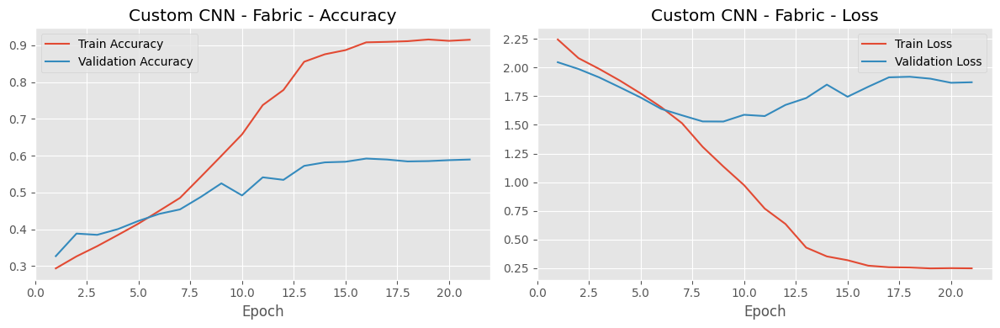

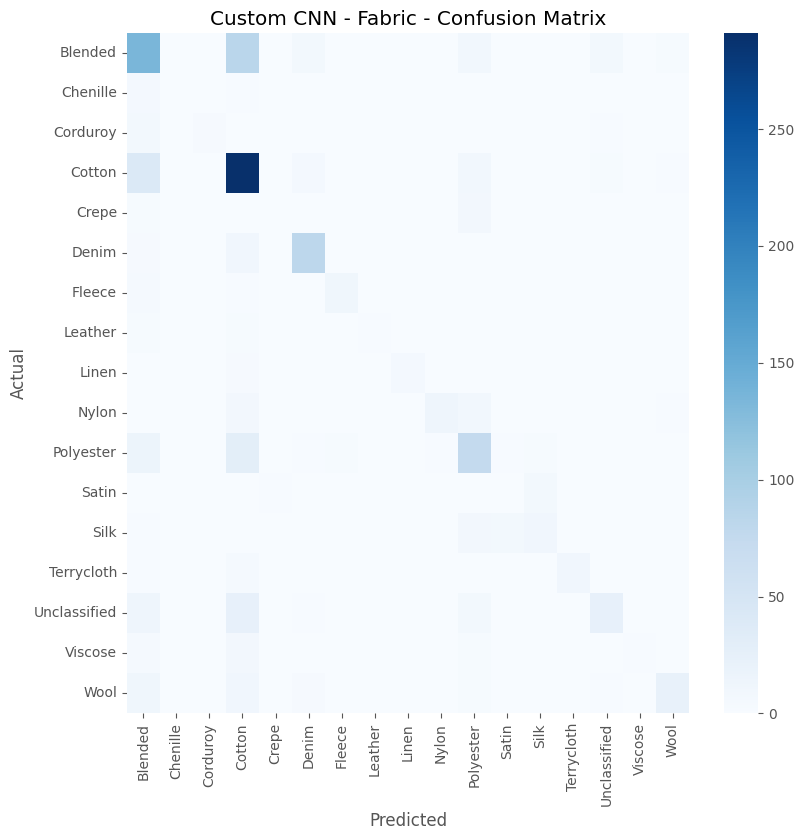


Custom CNN - Fabric - Classification Report

              precision    recall  f1-score   support

     Blended       0.52      0.55      0.53       247
    Chenille       0.00      0.00      0.00         8
    Corduroy       1.00      0.27      0.42        15
      Cotton       0.60      0.82      0.69       353
       Crepe       0.20      0.07      0.10        15
       Denim       0.78      0.84      0.81        97
      Fleece       0.71      0.60      0.65        20
     Leather       0.67      0.22      0.33         9
       Linen       1.00      0.50      0.67        12
       Nylon       0.87      0.38      0.53        34
   Polyester       0.55      0.55      0.55       136
       Satin       0.10      0.07      0.08        14
        Silk       0.46      0.37      0.41        30
  Terrycloth       1.00      0.61      0.76        18
Unclassified       0.57      0.34      0.42        74
     Viscose       0.67      0.09      0.16        22
        Wool       0.67      0.41  

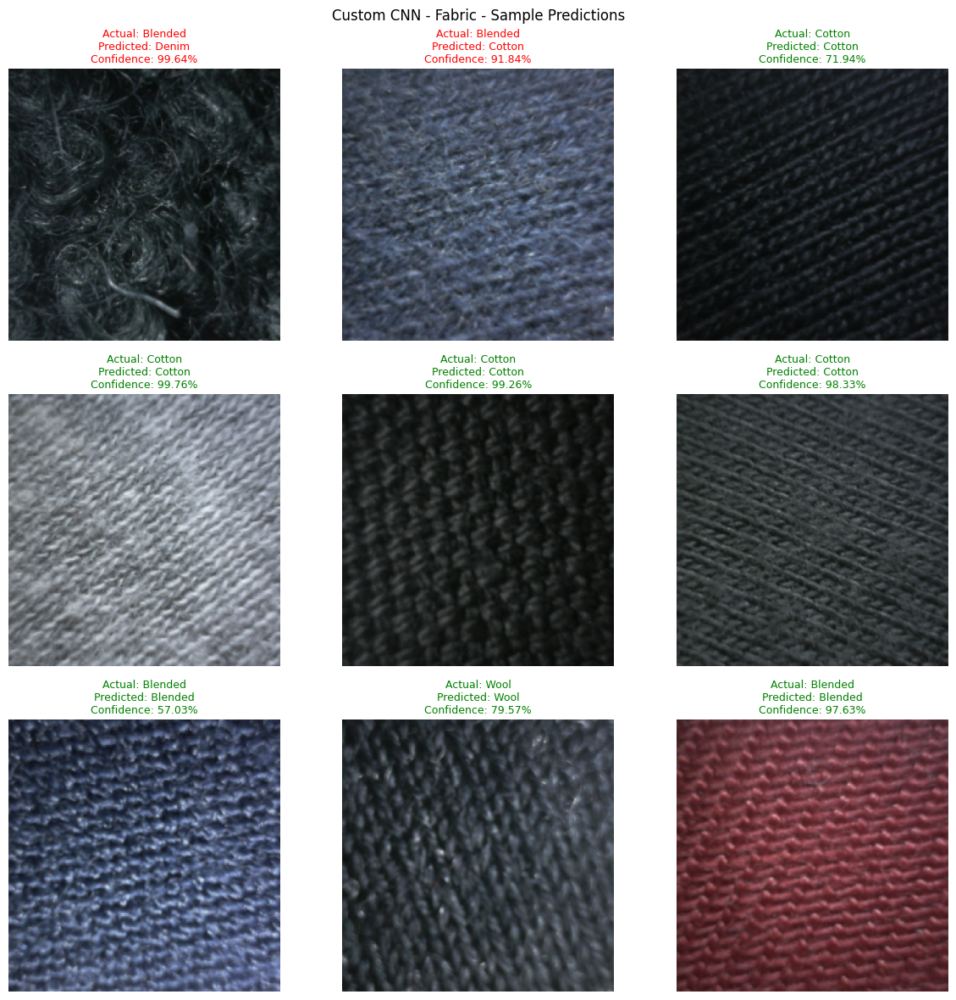

In [44]:
plot_training_curves(cnn_fabric_history, "Custom CNN - Fabric")
cnn_fabric_metrics = evaluate_classifier(cnn_fabric_model, fabric_test_ds, fabric_class_names, "Custom CNN - Fabric")

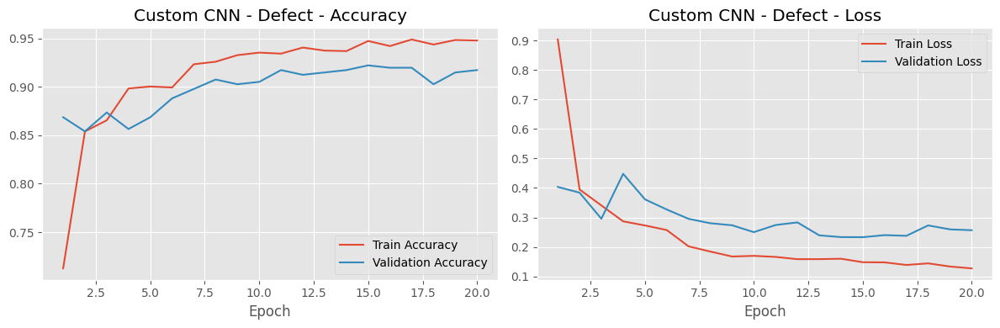

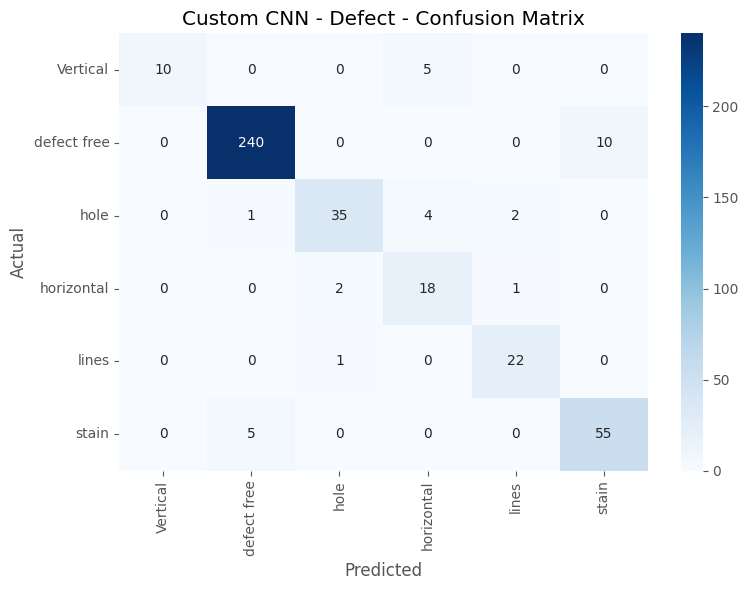


Custom CNN - Defect - Classification Report

              precision    recall  f1-score   support

    Vertical       1.00      0.67      0.80        15
 defect free       0.98      0.96      0.97       250
        hole       0.92      0.83      0.88        42
  horizontal       0.67      0.86      0.75        21
       lines       0.88      0.96      0.92        23
       stain       0.85      0.92      0.88        60

    accuracy                           0.92       411
   macro avg       0.88      0.87      0.86       411
weighted avg       0.93      0.92      0.93       411



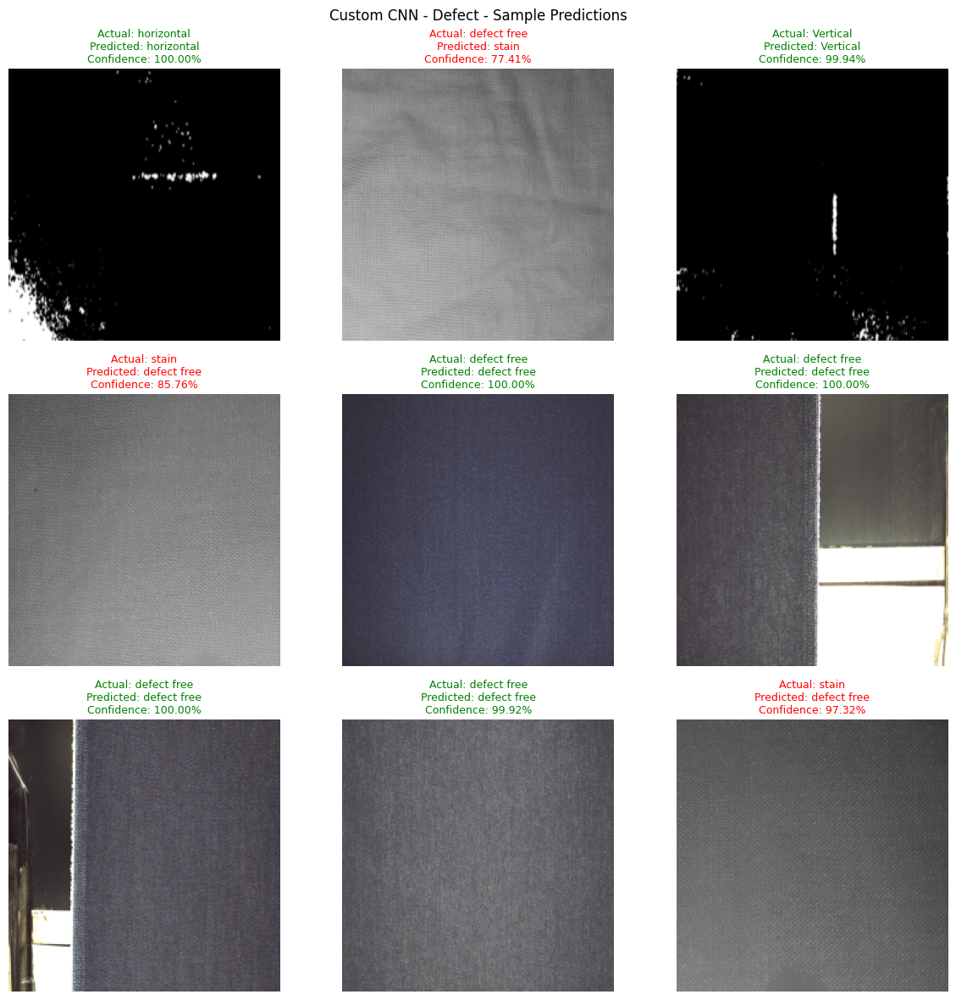

In [45]:
plot_training_curves(cnn_defect_history, "Custom CNN - Defect")
cnn_defect_metrics = evaluate_classifier(cnn_defect_model, defect_test_ds, defect_class_names, "Custom CNN - Defect")

The performance of the trained Custom CNN models is evaluated separately on both the **Fabric Classification** dataset and the **Fabric Defect Classification** dataset to assess their ability to generalize to unseen images.

The evaluation consists of the following components:

- **Training and Validation Curves:** Visualize the model's learning behaviour by comparing training and validation accuracy and loss across all epochs.
- **Confusion Matrix:** Displays the distribution of correct and incorrect predictions for each class, helping identify commonly confused categories.
- **Classification Report:** Provides Precision, Recall, F1-score, and overall accuracy for every class to measure classification performance.
- **Sample Predictions:** Displays randomly selected test images with their actual labels, predicted labels, and prediction confidence scores for qualitative evaluation.

The Fabric Classification evaluation measures the model's ability to distinguish between different fabric types, while the Fabric Defect Classification evaluation assesses its effectiveness in detecting and classifying textile defects. These results establish the baseline performance of the Custom CNN model and provide a benchmark for comparison with the EfficientNetB0 transfer learning model in the subsequent section.

# PART B - Transfer Learning (EfficientNetB0)

## 14. Build EfficientNetB0

The EfficientNetB0 base is loaded with ImageNet weights and its own preprocessing is applied to raw [0, 255] inputs. The base is frozen initially so only the new classification head is trained.

In [46]:
def build_efficientnet(num_classes, input_shape=(224, 224, 3), freeze_base=True):
    """Build an EfficientNetB0 transfer-learning model with a custom classification head."""

    inputs = layers.Input(shape=input_shape)
    x = efficientnet_preprocess(inputs)

    base_model = EfficientNetB0(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape
    )
    base_model.trainable = not freeze_base

    x = base_model(x, training=False if freeze_base else None)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(256, activation="relu")(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = models.Model(inputs, outputs, name="efficientnet_b0")
    model.base_model = base_model  # keep a handle for fine-tuning later

    return model

## 15. Compile EfficientNet

In [47]:
# Reuses the same compile_model() helper defined for the CNN
EFFICIENTNET_LR = 1e-4

## 16. Train EfficientNet

Only the classification head is trained in this stage; the pretrained convolutional base stays frozen.

In [49]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input as efficientnet_preprocess

In [50]:
# Train EfficientNetB0 (frozen base) - Fabric Classification
eff_fabric_model = build_efficientnet(NUM_FABRIC_CLASSES, freeze_base=True)
eff_fabric_model = compile_model(eff_fabric_model, learning_rate=EFFICIENTNET_LR)

eff_fabric_history, eff_fabric_train_time = train_model(
    eff_fabric_model, fabric_train_ds, fabric_val_ds,
    checkpoint_path=os.path.join(MODELS_DIR, "efficientnet_fabric_frozen_best.keras"),
    epochs=15
)

eff_fabric_test_loss, eff_fabric_test_acc = eff_fabric_model.evaluate(fabric_test_ds)
print(f"EfficientNetB0 (Fabric, frozen) Test Accuracy: {eff_fabric_test_acc:.4f}")

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
Epoch 1/15
169/169 ━━━━━━━━━━━━━━━━━━━━ 76s 285ms/step - accuracy: 0.3179 - loss: 2.1610 - val_accuracy: 0.4154 - val_loss: 1.7954 - learning_rate: 1.0000e-04
Epoch 2/15
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step - accuracy: 0.4190 - loss: 1.7701 - val_accuracy: 0.4991 - val_loss: 1.5479 - learning_rate: 1.0000e-04
Epoch 3/15
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step - accuracy: 0.4716 - loss: 1.5935 - val_accuracy: 0.5345 - val_loss: 1.4065 - learning_rate: 1.0000e-04
Epoch 4/15
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.4925 - loss: 1.4921 - val_accuracy: 0.5527 - val_loss: 1.3127 - learning_rate: 1.0000e-04
Epoch 5/15
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - accuracy: 0.5195 - loss: 1.4146 - val_accuracy: 0.5665 - val_loss: 1.2497 - learning_rate: 1.0000e-04
Epoch 6/15
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.5368 - loss: 1.3447 - val_accuracy: 0.5803 - val_loss: 1.1944 - learning_rate: 1.0000e-04
E

In [51]:
# Train EfficientNetB0 (frozen base) - Fabric Defect Classification
eff_defect_model = build_efficientnet(NUM_DEFECT_CLASSES, freeze_base=True)
eff_defect_model = compile_model(eff_defect_model, learning_rate=EFFICIENTNET_LR)

eff_defect_history, eff_defect_train_time = train_model(
    eff_defect_model, defect_train_ds, defect_val_ds,
    checkpoint_path=os.path.join(MODELS_DIR, "efficientnet_defect_frozen_best.keras"),
    epochs=15
)

eff_defect_test_loss, eff_defect_test_acc = eff_defect_model.evaluate(defect_test_ds)
print(f"EfficientNetB0 (Defect, frozen) Test Accuracy: {eff_defect_test_acc:.4f}")

Epoch 1/15
60/60 ━━━━━━━━━━━━━━━━━━━━ 61s 699ms/step - accuracy: 0.6604 - loss: 0.9208 - val_accuracy: 0.8564 - val_loss: 0.5037 - learning_rate: 1.0000e-04
Epoch 2/15
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - accuracy: 0.8503 - loss: 0.4652 - val_accuracy: 0.9124 - val_loss: 0.3372 - learning_rate: 1.0000e-04
Epoch 3/15
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.8743 - loss: 0.3448 - val_accuracy: 0.9075 - val_loss: 0.2752 - learning_rate: 1.0000e-04
Epoch 4/15
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - accuracy: 0.8868 - loss: 0.2984 - val_accuracy: 0.9319 - val_loss: 0.2420 - learning_rate: 1.0000e-04
Epoch 5/15
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.9077 - loss: 0.2560 - val_accuracy: 0.9367 - val_loss: 0.2214 - learning_rate: 1.0000e-04
Epoch 6/15
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step - accuracy: 0.9129 - loss: 0.2348 - val_accuracy: 0.9319 - val_loss: 0.2056 - learning_rate: 1.0000e-04
Epoch 7/15
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.923

## 17. Fine-Tuning

The last 20 layers of the EfficientNetB0 base are unfrozen so the model can adapt its higher-level features to fabrics and defects specifically. `BatchNormalization` layers are kept frozen, since fine-tuning them on a small batch size tends to destabilize training. A much lower learning rate avoids destroying the pretrained weights.

In [52]:
def fine_tune_model(model, train_ds, val_ds, checkpoint_path, unfreeze_layers=20,
                     learning_rate=1e-5, epochs=10):
    """Unfreeze the last N layers of the base model (except BatchNorm) and continue training."""

    base_model = model.base_model
    base_model.trainable = True

    for layer in base_model.layers[:-unfreeze_layers]:
        layer.trainable = False

    for layer in base_model.layers[-unfreeze_layers:]:
        if isinstance(layer, layers.BatchNormalization):
            layer.trainable = False

    model = compile_model(model, learning_rate=learning_rate)

    fine_tune_history, fine_tune_time = train_model(
        model, train_ds, val_ds, checkpoint_path, epochs=epochs, patience=4
    )

    return model, fine_tune_history, fine_tune_time

In [53]:
# Fine-tune EfficientNetB0 - Fabric Classification
eff_fabric_model, eff_fabric_ft_history, eff_fabric_ft_time = fine_tune_model(
    eff_fabric_model, fabric_train_ds, fabric_val_ds,
    checkpoint_path=os.path.join(MODELS_DIR, "efficientnet_fabric_finetuned_best.keras"),
    unfreeze_layers=20, learning_rate=1e-5, epochs=10
)

eff_fabric_total_train_time = eff_fabric_train_time + eff_fabric_ft_time

eff_fabric_test_loss, eff_fabric_test_acc = eff_fabric_model.evaluate(fabric_test_ds)
print(f"EfficientNetB0 (Fabric, fine-tuned) Test Accuracy: {eff_fabric_test_acc:.4f}")

Epoch 1/10
169/169 ━━━━━━━━━━━━━━━━━━━━ 63s 206ms/step - accuracy: 0.6249 - loss: 1.0509 - val_accuracy: 0.6649 - val_loss: 0.9496 - learning_rate: 1.0000e-05
Epoch 2/10
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - accuracy: 0.6267 - loss: 1.0286 - val_accuracy: 0.6675 - val_loss: 0.9302 - learning_rate: 1.0000e-05
Epoch 3/10
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - accuracy: 0.6271 - loss: 1.0041 - val_accuracy: 0.6744 - val_loss: 0.9137 - learning_rate: 1.0000e-05
Epoch 4/10
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - accuracy: 0.6401 - loss: 0.9837 - val_accuracy: 0.6831 - val_loss: 0.9013 - learning_rate: 1.0000e-05
Epoch 5/10
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step - accuracy: 0.6499 - loss: 0.9649 - val_accuracy: 0.6857 - val_loss: 0.8881 - learning_rate: 1.0000e-05
Epoch 6/10
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - accuracy: 0.6477 - loss: 0.9525 - val_accuracy: 0.6883 - val_loss: 0.8744 - learning_rate: 1.0000e-05
Epoch 7/10
169/169 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/st

In [54]:
# Fine-tune EfficientNetB0 - Fabric Defect Classification
eff_defect_model, eff_defect_ft_history, eff_defect_ft_time = fine_tune_model(
    eff_defect_model, defect_train_ds, defect_val_ds,
    checkpoint_path=os.path.join(MODELS_DIR, "efficientnet_defect_finetuned_best.keras"),
    unfreeze_layers=20, learning_rate=1e-5, epochs=10
)

eff_defect_total_train_time = eff_defect_train_time + eff_defect_ft_time

eff_defect_test_loss, eff_defect_test_acc = eff_defect_model.evaluate(defect_test_ds)
print(f"EfficientNetB0 (Defect, fine-tuned) Test Accuracy: {eff_defect_test_acc:.4f}")

Epoch 1/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 51s 488ms/step - accuracy: 0.9134 - loss: 0.2335 - val_accuracy: 0.9367 - val_loss: 0.2074 - learning_rate: 1.0000e-05
Epoch 2/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.9092 - loss: 0.2240 - val_accuracy: 0.9343 - val_loss: 0.2005 - learning_rate: 1.0000e-05
Epoch 3/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.9176 - loss: 0.2056 - val_accuracy: 0.9343 - val_loss: 0.1938 - learning_rate: 1.0000e-05
Epoch 4/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - accuracy: 0.9249 - loss: 0.2008 - val_accuracy: 0.9392 - val_loss: 0.1808 - learning_rate: 1.0000e-05
Epoch 5/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - accuracy: 0.9327 - loss: 0.1853 - val_accuracy: 0.9392 - val_loss: 0.1769 - learning_rate: 1.0000e-05
Epoch 6/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.9228 - loss: 0.1841 - val_accuracy: 0.9343 - val_loss: 0.1700 - learning_rate: 1.0000e-05
Epoch 7/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step - accuracy: 0.931

## 18. EfficientNet Evaluation

Same reusable `plot_training_curves` and `evaluate_classifier` functions from Section 11, applied to the fine-tuned EfficientNetB0 models. Training curves are shown for the fine-tuning stage, since that is the final state of each model.

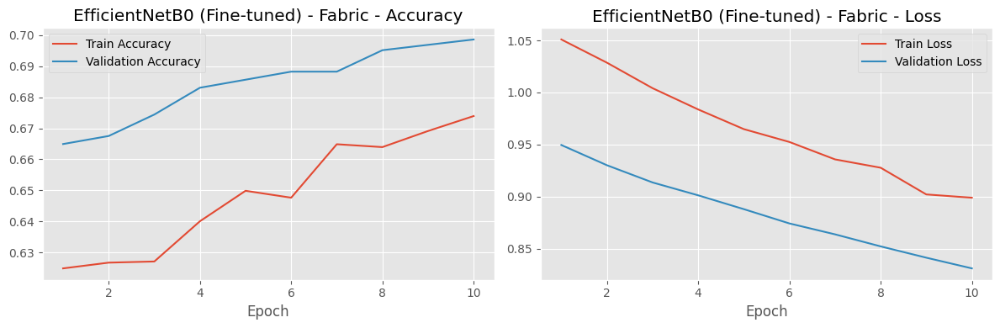

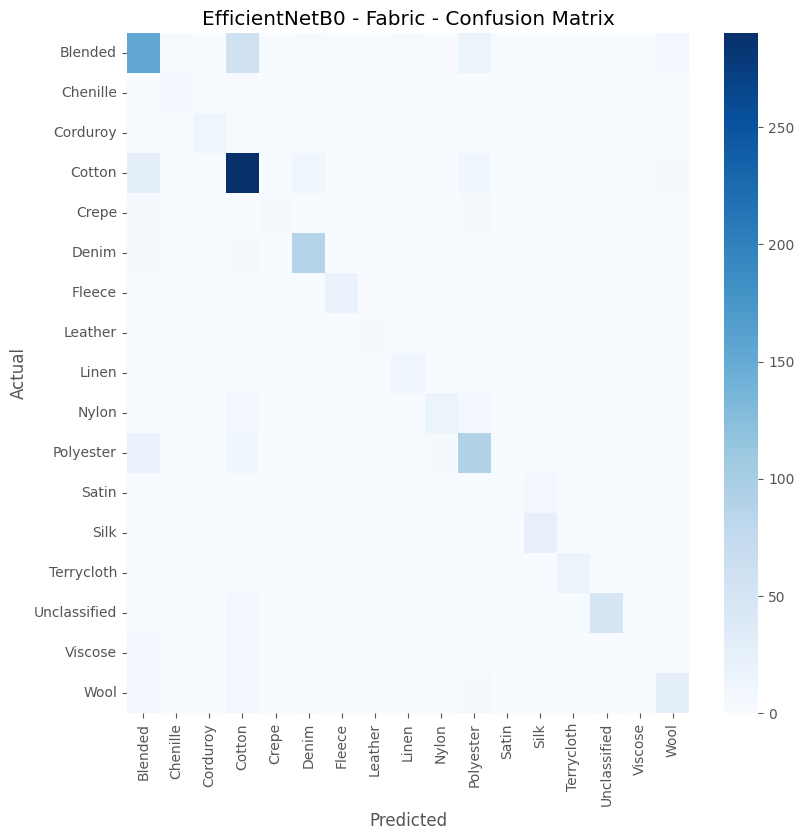


EfficientNetB0 - Fabric - Classification Report

              precision    recall  f1-score   support

     Blended       0.66      0.62      0.64       247
    Chenille       0.67      0.75      0.71         8
    Corduroy       0.72      0.87      0.79        15
      Cotton       0.71      0.82      0.76       353
       Crepe       0.56      0.33      0.42        15
       Denim       0.79      0.91      0.85        97
      Fleece       0.83      1.00      0.91        20
     Leather       1.00      0.44      0.62         9
       Linen       0.73      0.92      0.81        12
       Nylon       0.77      0.50      0.61        34
   Polyester       0.64      0.67      0.65       136
       Satin       0.00      0.00      0.00        14
        Silk       0.67      0.80      0.73        30
  Terrycloth       0.81      0.94      0.87        18
Unclassified       0.85      0.68      0.75        74
     Viscose       1.00      0.14      0.24        22
        Wool       0.70      0.

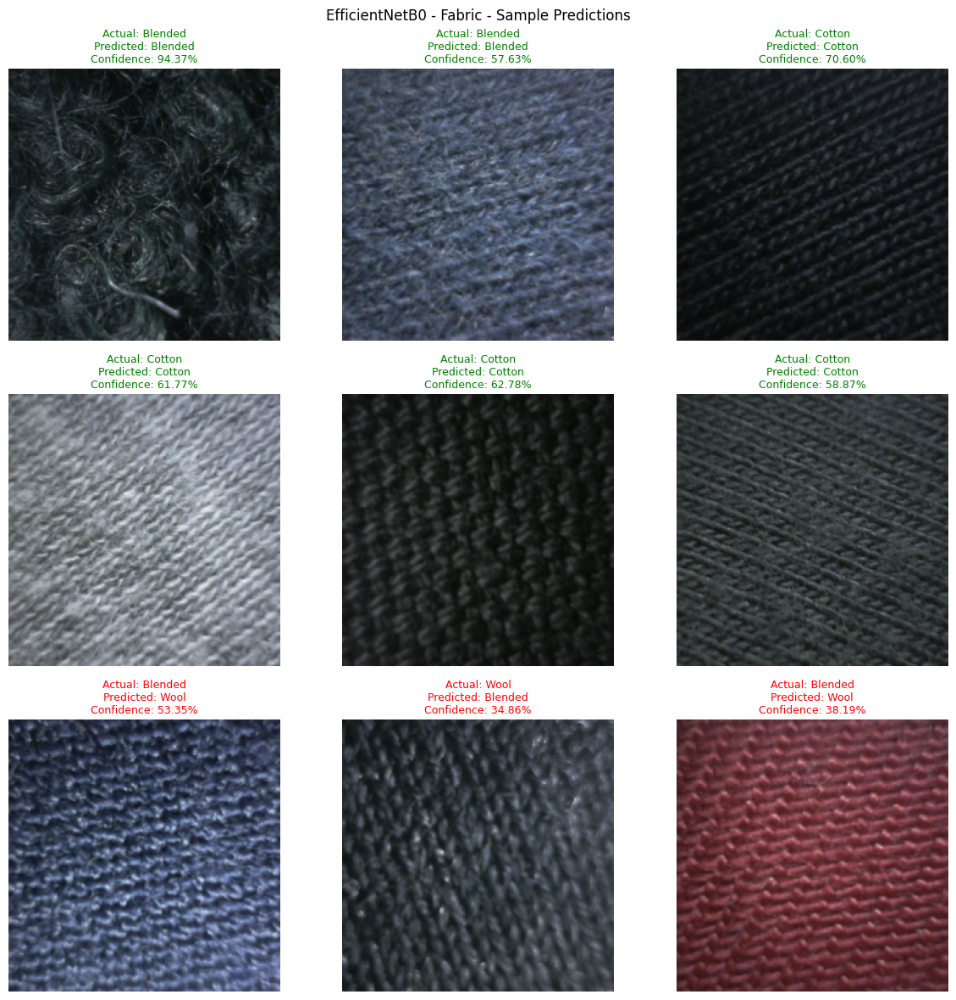

In [55]:
plot_training_curves(eff_fabric_ft_history, "EfficientNetB0 (Fine-tuned) - Fabric")
eff_fabric_metrics = evaluate_classifier(eff_fabric_model, fabric_test_ds, fabric_class_names, "EfficientNetB0 - Fabric")

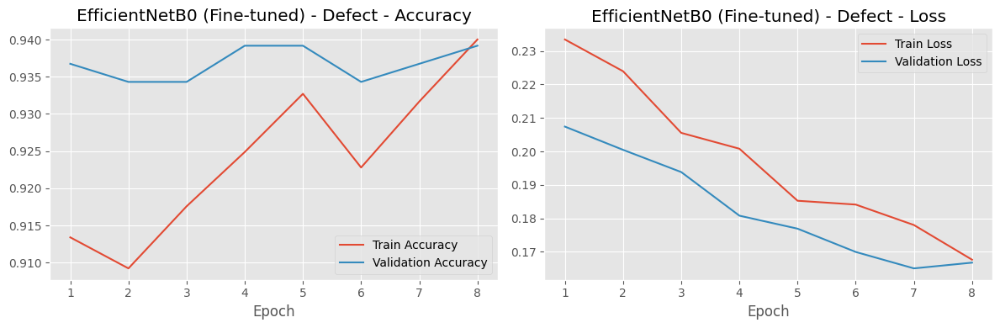

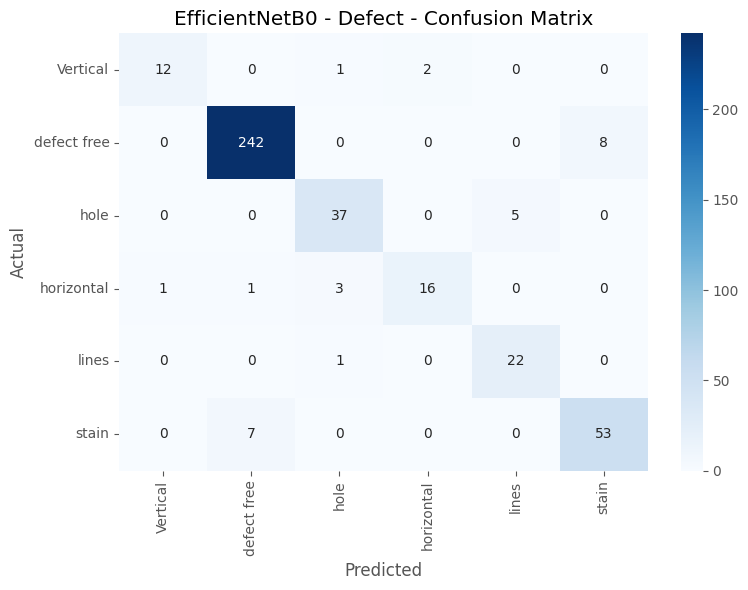


EfficientNetB0 - Defect - Classification Report

              precision    recall  f1-score   support

    Vertical       0.92      0.80      0.86        15
 defect free       0.97      0.97      0.97       250
        hole       0.88      0.88      0.88        42
  horizontal       0.89      0.76      0.82        21
       lines       0.81      0.96      0.88        23
       stain       0.87      0.88      0.88        60

    accuracy                           0.93       411
   macro avg       0.89      0.88      0.88       411
weighted avg       0.93      0.93      0.93       411



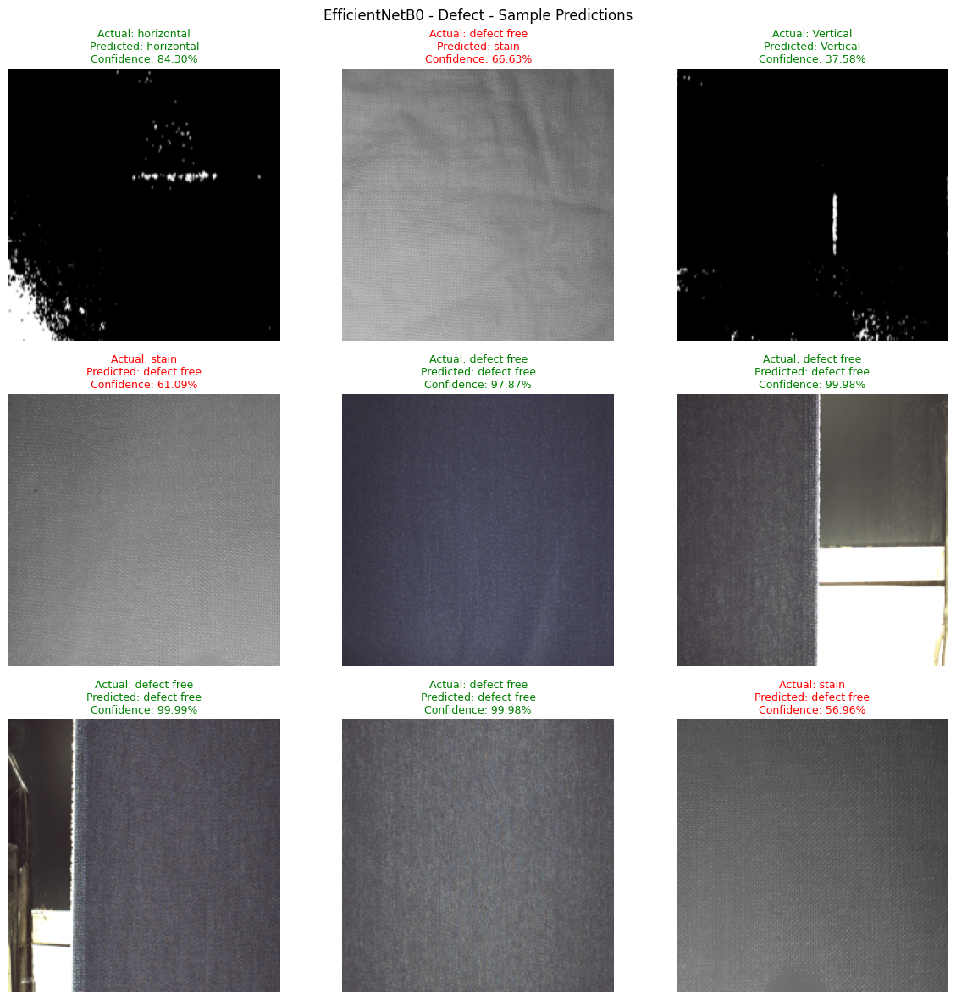

In [56]:
plot_training_curves(eff_defect_ft_history, "EfficientNetB0 (Fine-tuned) - Defect")
eff_defect_metrics = evaluate_classifier(eff_defect_model, defect_test_ds, defect_class_names, "EfficientNetB0 - Defect")

## 19. Performance Comparison

In [59]:
def get_model_size_mb(model, temp_path="/content/_size_check.keras"):
    """Save a model temporarily to measure its size on disk in megabytes."""
    model.save(temp_path)
    size_mb = os.path.getsize(temp_path) / (1024 * 1024)
    os.remove(temp_path)
    return round(size_mb, 2)


def build_comparison_table(task_name, cnn_model, cnn_history, cnn_train_time, cnn_test_acc, cnn_metrics,
                            eff_model, eff_train_time, eff_test_acc, eff_metrics):
    """Build a side-by-side comparison DataFrame for the CNN and EfficientNetB0 on one task."""

    rows = [
        {
            "Metric": "Training Accuracy",
            "Custom CNN": round(cnn_history.history["accuracy"][-1], 4),
            "EfficientNetB0": round(eff_model_last_train_acc, 4)
        },
        {
            "Metric": "Validation Accuracy",
            "Custom CNN": round(cnn_history.history["val_accuracy"][-1], 4),
            "EfficientNetB0": round(eff_model_last_val_acc, 4)
        },
        {
            "Metric": "Test Accuracy",
            "Custom CNN": round(cnn_test_acc, 4),
            "EfficientNetB0": round(eff_test_acc, 4)
        },
        {
            "Metric": "Precision",
            "Custom CNN": round(cnn_metrics["precision"], 4),
            "EfficientNetB0": round(eff_metrics["precision"], 4)
        },
        {
            "Metric": "Recall",
            "Custom CNN": round(cnn_metrics["recall"], 4),
            "EfficientNetB0": round(eff_metrics["recall"], 4)
        },
        {
            "Metric": "F1-score",
            "Custom CNN": round(cnn_metrics["f1_score"], 4),
            "EfficientNetB0": round(eff_metrics["f1_score"], 4)
        },
        {
            "Metric": "Training Time (s)",
            "Custom CNN": round(cnn_train_time, 1),
            "EfficientNetB0": round(eff_train_time, 1)
        },
        {
            "Metric": "Model Size (MB)",
            "Custom CNN": get_model_size_mb(cnn_model),
            "EfficientNetB0": get_model_size_mb(eff_model)
        },
    ]

    df = pd.DataFrame(rows)
    print(f"\n{task_name} - Custom CNN vs. EfficientNetB0\n")
    display(df)
    return df

In [60]:
# Fabric Classification Comparison
eff_model_last_train_acc = eff_fabric_ft_history.history["accuracy"][-1]
eff_model_last_val_acc = eff_fabric_ft_history.history["val_accuracy"][-1]

fabric_comparison_df = build_comparison_table(
    "Fabric Classification",
    cnn_fabric_model, cnn_fabric_history, cnn_fabric_train_time, cnn_fabric_test_acc, cnn_fabric_metrics,
    eff_fabric_model, eff_fabric_total_train_time, eff_fabric_test_acc, eff_fabric_metrics
)


Fabric Classification - Custom CNN vs. EfficientNetB0



,Metric,Custom CNN,EfficientNetB0
0,Training Accuracy,0.9152,0.6739
1,Validation Accuracy,0.5898,0.6986
2,Test Accuracy,0.5976,0.7098
3,Precision,0.6019,0.7087
4,Recall,0.5976,0.7098
5,F1-score,0.5781,0.6978
6,Training Time (s),349.6000,391.4000
7,Model Size (MB),295.1700,30.3200


In [61]:
# Fabric Defect Comparison
eff_model_last_train_acc = eff_defect_ft_history.history["accuracy"][-1]
eff_model_last_val_acc = eff_defect_ft_history.history["val_accuracy"][-1]

defect_comparison_df = build_comparison_table(
    "Fabric Defect Classification",
    cnn_defect_model, cnn_defect_history, cnn_defect_train_time, cnn_defect_test_acc, cnn_defect_metrics,
    eff_defect_model, eff_defect_total_train_time, eff_defect_test_acc, eff_defect_metrics
)


Fabric Defect Classification - Custom CNN vs. EfficientNetB0



,Metric,Custom CNN,EfficientNetB0
0,Training Accuracy,0.9478,0.9400
1,Validation Accuracy,0.9173,0.9392
2,Test Accuracy,0.9246,0.9294
3,Precision,0.9309,0.9304
4,Recall,0.9246,0.9294
5,F1-score,0.9253,0.9292
6,Training Time (s),109.0000,181.6000
7,Model Size (MB),295.1400,30.2800


## 20. Select Best Model

In [62]:
def select_best_model(task_name, cnn_test_acc, eff_test_acc, cnn_model, eff_model):
    """Select the better-performing model for a task based on test accuracy."""

    if eff_test_acc >= cnn_test_acc:
        winner_name = "EfficientNetB0"
        winner_model = eff_model
    else:
        winner_name = "Custom CNN"
        winner_model = cnn_model

    print(f"{task_name}: Selected Model -> {winner_name} "
          f"(CNN: {cnn_test_acc:.4f} | EfficientNetB0: {eff_test_acc:.4f})")

    return winner_name, winner_model


best_fabric_model_name, best_fabric_model = select_best_model(
    "Fabric Classification", cnn_fabric_test_acc, eff_fabric_test_acc, cnn_fabric_model, eff_fabric_model
)

best_defect_model_name, best_defect_model = select_best_model(
    "Fabric Defect Classification", cnn_defect_test_acc, eff_defect_test_acc, cnn_defect_model, eff_defect_model
)

Fabric Classification: Selected Model -> EfficientNetB0 (CNN: 0.5976 | EfficientNetB0: 0.7098)
Fabric Defect Classification: Selected Model -> EfficientNetB0 (CNN: 0.9246 | EfficientNetB0: 0.9294)


In [63]:
# Save every trained model
cnn_fabric_model.save(os.path.join(MODELS_DIR, "cnn_fabric.keras"))
cnn_defect_model.save(os.path.join(MODELS_DIR, "cnn_defect.keras"))
eff_fabric_model.save(os.path.join(MODELS_DIR, "efficientnet_fabric.keras"))
eff_defect_model.save(os.path.join(MODELS_DIR, "efficientnet_defect.keras"))

# Save the automatically selected best model per task
best_fabric_model.save(os.path.join(MODELS_DIR, "best_fabric_model.keras"))
best_defect_model.save(os.path.join(MODELS_DIR, "best_defect_model.keras"))

print("All models saved to:", MODELS_DIR)
for f in sorted(os.listdir(MODELS_DIR)):
    print(" -", f)

All models saved to: /content/models
 - best_defect_model.keras
 - best_fabric_model.keras
 - cnn_defect.keras
 - cnn_defect_best.keras
 - cnn_fabric.keras
 - cnn_fabric_best.keras
 - efficientnet_defect.keras
 - efficientnet_defect_finetuned_best.keras
 - efficientnet_defect_frozen_best.keras
 - efficientnet_fabric.keras
 - efficientnet_fabric_finetuned_best.keras
 - efficientnet_fabric_frozen_best.keras


# 21. Final Conclusion

This notebook developed and evaluated two deep learning approaches for textile image analysis:

1. **Custom CNN** – a baseline convolutional neural network trained from scratch.
2. **EfficientNetB0** – a transfer learning model pretrained on ImageNet and fine-tuned on the textile datasets.

### Final Performance

| Task | Best Model | Test Accuracy |
|------|------------|--------------:|
| Fabric Classification (17 Classes) | EfficientNetB0 (Fine-tuned) | **70.98%** |
| Fabric Defect Classification (6 Classes) | EfficientNetB0 (Fine-tuned) | **92.94%** |

The comparison demonstrates that transfer learning significantly improves fabric classification performance while maintaining excellent defect classification accuracy. The best-performing models were saved for integration into the Textile Waste Intelligence Platform for real-time prediction and decision support.